<a href="https://colab.research.google.com/github/ishansharma95/Ear_Landmark_Detection/blob/main/Yolo_Ear.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os

#os.chdir('/')

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


**Methods to show pts labels**

In [ ]:
!ls

3rdparty	DarknetConfig.cmake.in	json_mjpeg_streams.sh  results
backup		darknet_images.py	LICENSE		       scripts
build		darknet.py		Makefile	       src
build.ps1	darknet_video.py	net_cam_v3.sh	       vcpkg.json
cfg		data			net_cam_v4.sh	       video_yolov3.sh
cmake		image_yolov3.sh		obj		       video_yolov4.sh
CMakeLists.txt	image_yolov4.sh		predictions.jpg
darknet		include			README.md


In [ ]:
"""
This script shows how to read iBUG pts file and draw all the landmark points on image.
"""

import json
import os

import cv2
from google.colab.patches import cv2_imshow
import numpy as np
from tqdm import tqdm

import face_detector as fd
import pose_estimator as pe
from file_list_generator import ListGenerator

#IMAGE_DIR = "/data/landmark/image"
IMAGE_DIR = "/content/drive/My Drive/CollectionA/train"
MARK_DIR = "/content/drive/My Drive/CollectionA/train"
POSE_DIR = "/content/drive/My Drive/CollectionA"

IMG_SIZE = 112
PREVIEW_FACE_SIZE = 512


def read_points(file_name=None):
    """
    Read points from .pts file.
    """
    points = []
    with open(file_name) as file:
        line_count = 0
        for line in file:
            if "version" in line or "points" in line or "{" in line or "}" in line:
                continue
            else:
                loc_x, loc_y = line.strip().split(sep=" ")
                points.append([float(loc_x), float(loc_y)])
                line_count += 1
    return points


def draw_landmark_point(image, points):
    """
    Draw landmark point on image.
    """
    print(points)
    for point in points:
        cv2.circle(image, (int(point[0]), int(
            point[1])), 3, (0, 255, 0), -1, cv2.LINE_AA)


def points_are_valid(points, image):
    """Check if all points are in image"""
    min_box = get_minimal_box(points)
    if box_in_image(min_box, image):
        return True
    return False


def get_square_box(box):
    """Get the square boxes which are ready for CNN from the boxes"""
    left_x = box[0]
    top_y = box[1]
    right_x = box[2]
    bottom_y = box[3]

    box_width = right_x - left_x
    box_height = bottom_y - top_y

    # Check if box is already a square. If not, make it a square.
    diff = box_height - box_width
    delta = int(abs(diff) / 2)

    if diff == 0:                   # Already a square.
        return box
    elif diff > 0:                  # Height > width, a slim box.
        left_x -= delta
        right_x += delta
        if diff % 2 == 1:
            right_x += 1
    else:                           # Width > height, a short box.
        top_y -= delta
        bottom_y += delta
        if diff % 2 == 1:
            bottom_y += 1

    # Make sure box is always square.
    assert ((right_x - left_x) == (bottom_y - top_y)), 'Box is not square.'

    return [left_x, top_y, right_x, bottom_y]


def get_minimal_box(points):
    """
    Get the minimal bounding box of a group of points.
    The coordinates are also converted to int numbers.
    """
    min_x = int(min([point[0] for point in points]))
    max_x = int(max([point[0] for point in points]))
    min_y = int(min([point[1] for point in points]))
    max_y = int(max([point[1] for point in points]))
    return [min_x, min_y, max_x, max_y]


def move_box(box, offset):
    """Move the box to direction specified by offset"""
    left_x = box[0] + offset[0]
    top_y = box[1] + offset[1]
    right_x = box[2] + offset[0]
    bottom_y = box[3] + offset[1]
    return [left_x, top_y, right_x, bottom_y]


def expand_box(square_box, scale_ratio=1.2):
    """Scale up the box"""
    assert (scale_ratio >= 1), "Scale ratio should be greater than 1."
    delta = int((square_box[2] - square_box[0]) * (scale_ratio - 1) / 2)
    left_x = square_box[0] - delta
    left_y = square_box[1] - delta
    right_x = square_box[2] + delta
    right_y = square_box[3] + delta
    return [left_x, left_y, right_x, right_y]


def points_in_box(points, box):
    """Check if box contains all the points"""
    minimal_box = get_minimal_box(points)
    return box[0] <= minimal_box[0] and \
        box[1] <= minimal_box[1] and \
        box[2] >= minimal_box[2] and \
        box[3] >= minimal_box[3]


def box_in_image(box, image):
    """Check if the box is in image"""
    rows = image.shape[0]
    cols = image.shape[1]
    return box[0] >= 0 and box[1] >= 0 and box[2] <= cols and box[3] <= rows


def box_is_valid(image, points, box):
    """Check if box is valid."""
    # Box contains all the points.
    points_is_in_box = points_in_box(points, box)

    # Box is in image.
    box_is_in_image = box_in_image(box, image)

    # Box is square.
    w_equal_h = (box[2] - box[0]) == (box[3] - box[1])

    # Return the result.
    return box_is_in_image and points_is_in_box and w_equal_h


def fit_by_shifting(box, rows, cols):
    """Method 1: Try to move the box."""
    # Face box points.
    left_x = box[0]
    top_y = box[1]
    right_x = box[2]
    bottom_y = box[3]

    # Check if moving is possible.
    if right_x - left_x <= cols and bottom_y - top_y <= rows:
        if left_x < 0:                  # left edge crossed, move right.
            right_x += abs(left_x)
            left_x = 0
        if right_x > cols:              # right edge crossed, move left.
            left_x -= (right_x - cols)
            right_x = cols
        if top_y < 0:                   # top edge crossed, move down.
            bottom_y += abs(top_y)
            top_y = 0
        if bottom_y > rows:             # bottom edge crossed, move up.
            top_y -= (bottom_y - rows)
            bottom_y = rows

    return [left_x, top_y, right_x, bottom_y]


def fit_by_shrinking(box, rows, cols):
    """Method 2: Try to shrink the box."""
    # Face box points.
    left_x = box[0]
    top_y = box[1]
    right_x = box[2]
    bottom_y = box[3]

    # The first step would be get the interlaced area.
    if left_x < 0:                  # left edge crossed, set zero.
        left_x = 0
    if right_x > cols:              # right edge crossed, set max.
        right_x = cols
    if top_y < 0:                   # top edge crossed, set zero.
        top_y = 0
    if bottom_y > rows:             # bottom edge crossed, set max.
        bottom_y = rows

    # Then found out which is larger: the width or height. This will
    # be used to decide in which dimension the size would be shrunken.
    width = right_x - left_x
    height = bottom_y - top_y
    delta = abs(width - height)
    # Find out which dimension should be altered.
    if width > height:                  # x should be altered.
        if left_x != 0 and right_x != cols:     # shrink from center.
            left_x += int(delta / 2)
            right_x -= int(delta / 2) + delta % 2
        elif left_x == 0:                       # shrink from right.
            right_x -= delta
        else:                                   # shrink from left.
            left_x += delta
    else:                               # y should be altered.
        if top_y != 0 and bottom_y != rows:     # shrink from center.
            top_y += int(delta / 2) + delta % 2
            bottom_y -= int(delta / 2)
        elif top_y == 0:                        # shrink from bottom.
            bottom_y -= delta
        else:                                   # shrink from top.
            top_y += delta

    return [left_x, top_y, right_x, bottom_y]


def fit_box(box, image, points):
    """
    Try to fit the box, make sure it satisfy following conditions:
    - A square.
    - Inside the image.
    - Contains all the points.
    If all above failed, return None.
    """
    rows = image.shape[0]
    cols = image.shape[1]

    # First try to move the box.
    box_moved = fit_by_shifting(box, rows, cols)

    # If moving fails ,try to shrink.
    if box_is_valid(image, points, box_moved):
        return box_moved
    else:
        box_shrunken = fit_by_shrinking(box, rows, cols)

    # If shrink failed, return None
    if box_is_valid(image, points, box_shrunken):
        return box_shrunken

    # Finally, Worst situation.
    print("Fitting failed!")
    return None


def get_valid_box(image, points):
    """
    Try to get a valid face box which meets the requirements.
    The function follows these steps:
        1. Try method 1, if failed:
        2. Try method 0, if failed:
        3. Return None
    """
    # Try method 1 first.
    def _get_positive_box(raw_boxes, points):
        for box in raw_boxes:
            # Move box down.
            diff_height_width = (box[3] - box[1]) - (box[2] - box[0])
            offset_y = int(abs(diff_height_width / 2))
            box_moved = move_box(box, [0, offset_y])

            # Make box square.
            square_box = get_square_box(box_moved)

            # Remove false positive boxes.
            if points_in_box(points, square_box):
                return square_box
        return None

    # Try to get a positive box from face detection results.
    _, raw_boxes = fd.get_facebox(image, threshold=0.5)
    positive_box = _get_positive_box(raw_boxes, points)
    if positive_box is not None:
        if box_in_image(positive_box, image) is True:
            return positive_box
        return fit_box(positive_box, image, points)

    # Method 1 failed, Method 0
    min_box = get_minimal_box(points)
    sqr_box = get_square_box(min_box)
    epd_box = expand_box(sqr_box)
    if box_in_image(epd_box, image) is True:
        return epd_box
    return fit_box(epd_box, image, points)


def preview(point_file):
    """
    Preview points on image.
    """
    # Read the points from file.
    raw_points = read_points(point_file)
    print(raw_points)
    # Safe guard, make sure point importing goes well.
    #assert len(raw_points) == 68, "The landmarks should contain 68 points."

    # Read the image.
    head, tail = os.path.split(point_file)
    image_file = tail.split('.')[-2]
    img_jpg = os.path.join(head, image_file + ".jpg")
    img_png = os.path.join(head, image_file + ".png")
    if os.path.exists(img_jpg):
        img = cv2.imread(img_jpg)
    else:
        img = cv2.imread(img_png)

    # Fast check: all points are in image.
    if points_are_valid(raw_points, img) is False:
        return None

    # Get the valid facebox.
    facebox = get_valid_box(img, raw_points)
    if facebox is None:
        print("Using minimal box.")
        facebox = get_minimal_box(raw_points)

    # Draw all the points and face box in image.
    fd.draw_box(img, [facebox], box_color=(0, 255, 0))
    draw_landmark_point(img, raw_points)

    # Extract valid image area.
    face_area = img[facebox[1]:facebox[3],
                    facebox[0]: facebox[2]]

    # Show all face area in the same size, resize them if needed.
    width = facebox[2] - facebox[0]
    height = facebox[3] - facebox[1]
    if width != height:
        print('Oops!', width, height)
    if (width != PREVIEW_FACE_SIZE) or (height != PREVIEW_FACE_SIZE):
        face_area = cv2.resize(
            face_area, (PREVIEW_FACE_SIZE, PREVIEW_FACE_SIZE))

    # # Show the face area and the whole image.
    width, height = img.shape[:2]
    max_height = 640
    if height > max_height:
        img = cv2.resize(
            img, (max_height, int(width * max_height / height)))
    cv2_imshow( img)
    cv2_imshow(face_area)

    if cv2.waitKey() == 27:
        exit()


def preview_json(json_file):
    """
    Preview points on image.
    """
    # Read the points from file.
    with open(json_file, 'r') as f:
        data = json.load(f)
        raw_points = np.reshape(data, (-1, 2))
    marks = raw_points * PREVIEW_FACE_SIZE
    print(raw_points)
    # Safe guard, make sure point importing goes well.
    assert len(raw_points) == 68, "The landmarks should contain 68 points."

    # Read the image.
    _, tail = os.path.split(json_file)
    image_file = tail.split('.')[-2]
    img_jpg = os.path.join(IMAGE_DIR, image_file + ".jpg")
    img = cv2.imread(img_jpg)
    img = cv2.resize(img, (PREVIEW_FACE_SIZE, PREVIEW_FACE_SIZE))

    # Fast check: all points are in image.
    if points_are_valid(marks, img) is False:
        return None

    # Get the pose.
    estimator = pe.PoseEstimator(
        img_size=(PREVIEW_FACE_SIZE, PREVIEW_FACE_SIZE))
    pose = estimator.solve_pose_by_68_points(marks)

    # Uncomment the following line to draw the 3D model points.
    # estimator.show_3d_model()

    # Draw annotations.
    estimator.draw_annotation_box(img, pose[0], pose[1])
    estimator.draw_axis(img, pose[0], pose[1])
    draw_landmark_point(img, marks)

    # Solve the pitch, yaw and roll angels.
    r_mat, _ = cv2.Rodrigues(pose[0])
    p_mat = np.hstack((r_mat, np.array([[0], [0], [0]])))
    _, _, _, _, _, _, u_angle = cv2.decomposeProjectionMatrix(p_mat)
    pitch, yaw, roll = u_angle.flatten()

    # I do not know why the roll axis seems flipted 180 degree. Manually by pass
    # this issue.
    if roll > 0:
        roll = 180-roll
    elif roll < 0:
        roll = -(180 + roll)

    # print("pitch: {:.2f}, yaw: {:.2f}, roll: {:.2f}".format(pitch, yaw, roll))

    # Save the pose in json files.
    pose = {
        "pitch": pitch/180,
        "yaw": yaw/180,
        "roll": roll/180
    }
    pose_file_path = os.path.join(POSE_DIR, image_file + "-pose.json")
    with open(pose_file_path, 'w') as fid:
        json.dump(pose, fid)

    # Show the face area and the whole image.
    cv2.imshow("preview", img)
    if cv2.waitKey(60) == 27:
        exit()


def view_pts():
    # List all the files
    lg = ListGenerator()
    lg
    pts_file_list = lg.generate_list(MARK_DIR, ['pts'])

    # Show the image one by one.
    for file_name in pts_file_list:
        preview(file_name)


def view_json():
    # List all the files
    lg = ListGenerator()
    json_file_list = lg.generate_list(MARK_DIR, ['json'])

    # Show the image one by one.
    for file_name in tqdm(json_file_list):
        preview_json(file_name)


def main():
    """
    The main entrance
    """
    # You can..
    view_pts()
    # or,
    #view_json()


if __name__ == "__main__":
    main()

In [ ]:
!ls

3rdparty	DarknetConfig.cmake.in	json_mjpeg_streams.sh  scripts
backup		darknet_images.py	LICENSE		       src
build		darknet.py		Makefile	       vcpkg.json
build.ps1	darknet_video.py	net_cam_v3.sh	       video_yolov3.sh
cfg		data			net_cam_v4.sh	       video_yolov4.sh
cmake		image_yolov3.sh		obj
CMakeLists.txt	image_yolov4.sh		README.md
darknet		include			results


In [ ]:
!pip install face_detector

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 9.1 MB 4.2 MB/s 
     |████████████████████████████████| 3.2 MB 20.4 MB/s 
     |████████████████████████████████| 87 kB 5.7 MB/s 
     |████████████████████████████████| 25.4 MB 1.3 MB/s 
     |████████████████████████████████| 3.4 MB 26.7 MB/s 
     |████████████████████████████████| 56 kB 5.1 MB/s 
     |████████████████████████████████| 328 kB 54.9 MB/s 
     |████████████████████████████████| 17.3 MB 248 kB/s 
     |████████████████████████████████| 99 kB 7.8 MB/s 
     |████████████████████████████████| 1.2 MB 58.3 MB/s 
     |████████████████████████████████| 51 kB 500 kB/s 
     |████████████████████████████████| 10.8 MB 53.6 MB/s 
     |████████████████████████████████| 59 kB 6.5 MB/s 
     |████████████████████████████████| 367 kB 74.7 MB/s 
     |████████████████████████████████| 92.6 MB 65 kB/s 
     |████████████████████████████████| 10

In [ ]:
!git clone https://github.com/AlexeyAB/darknet

Cloning into 'darknet'...
remote: Enumerating objects: 15833, done.
remote: Total 15833 (delta 0), reused 0 (delta 0), pack-reused 15833
Receiving objects: 100% (15833/15833), 14.39 MiB | 22.33 MiB/s, done.
Resolving deltas: 100% (10666/10666), done.


In [ ]:
%cd darknet
!sed -i 's/OPENCV=0/OPENCV=1/' Makefile
!sed -i 's/GPU=0/GPU=1/' Makefile
!sed -i 's/CUDNN=0/CUDNN=1/' Makefile
!sed -i 's/CUDNN_HALF=0/CUDNN_HALF=1/' Makefile
!sed -i 's/OPENMP=0/OPENMP=1/' Makefile

/content/darknet


In [ ]:
!make

mkdir -p ./obj/
mkdir -p backup
mkdir -p results
chmod +x *.sh
g++ -std=c++11 -std=c++11 -Iinclude/ -I3rdparty/stb/include -DOPENCV `pkg-config --cflags opencv4 2> /dev/null || pkg-config --cflags opencv` -DGPU -I/usr/local/cuda/include/ -DCUDNN -DCUDNN_HALF -Wall -Wfatal-errors -Wno-unused-result -Wno-unknown-pragmas -fPIC -rdynamic -Ofast -DOPENCV -fopenmp -DGPU -DCUDNN -I/usr/local/cudnn/include -DCUDNN_HALF -c ./src/image_opencv.cpp -o obj/image_opencv.o
./src/image_opencv.cpp: In function ‘void draw_detections_cv_v3(void**, detection*, int, float, char**, image**, int, int)’:
./src/image_opencv.cpp:945:23: warning: variable ‘rgb’ set but not used []8;;https://gcc.gnu.org/onlinedocs/gcc/Warning-Options.html#index-Wunused-but-set-variable-Wunused-but-set-variable]8;;]
  945 |                 float rgb[3];
      |                       ^~~
./src/image_opencv.cpp: In function ‘void cv_draw_object(image, float*, int, int, int*, float*, int*, int, char**)’:
./src/image_opencv.cpp:14

In [ ]:
!nvidia-smi

Tue Mar  8 22:19:25 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P0    27W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

**Training the model**

In [ ]:
!./darknet detector map /content/drive/MyDrive/obj.data /content/drive/MyDrive/yolov4.cfg /content/drive/MyDrive/outputs/yolov4-obj_1000.weights

**Creating txt files in the directory of each image**

In [ ]:
import glob
from PIL import *
import os

def convert(size, box):
    dw = 1./size[0]
    dh = 1./size[1]
    x = (box[0] + box[1])/2.0
    y = (box[2] + box[3])/2.0
    w = box[1] - box[0]
    h = box[3] - box[2]
    x = x*dw
    w = w*dw
    y = y*dh
    h = h*dh
    return "0 " +str(x) + str(y) + str(w) + str(h)

#im=Image.open(img_path)
#w= int(im.size[0])
#h= int(im.size[1])


def read_points(file_name=None):
    """
    Read points from .pts file.
    """
    points = []
    with open(file_name) as file:
        line_count = 0
        for line in file:
            if "version" in line or "points" in line or "{" in line or "}" in line:
                continue
            else:
                loc_x, loc_y = line.strip().split(sep=" ")
                points.append([float(loc_x), float(loc_y)])
                line_count += 1
    return points

folderlist = glob.glob("/content/drive/MyDrive/collectionb/CollectionB/*")
for folder in folderlist:
    imgList = glob.glob(folder+"/*.png")
    for img in imgList:
      ptsFile = os.path.splitext(img)[0]+'.pts'
      points=read_points(ptsFile)
      print(points)
      #b = (xmin, xmax, ymin, ymax)
      point = (points[0][0], points[2][0], points[0][1], points[1][1])
      #print(point)
      im=Image.open(img)
      w= int(im.size[0])
      h= int(im.size[1])
      bb = convert((w,h), point)
      head_tail = os.path.split(ptsFile)
      txtFileName=os.path.splitext(head_tail[1])[0]+'.txt'
      f= open(folder+txtFileName,"w+")
      f.write(bb)
      f.close()


[[709.0, 178.667], [709.0, 257.333], [749.0, 257.333], [749.0, 178.667]]
[[482.974, 37.669], [482.974, 60.261], [495.566, 60.261], [495.566, 37.669]]
[[334.531, 87.255], [334.531, 122.083], [352.462, 122.083], [352.462, 87.255]]
[[297.708, 101.667], [297.708, 137.917], [315.208, 137.917], [315.208, 101.667]]
[[288.5, 148.0], [288.5, 233.0], [323.5, 233.0], [323.5, 148.0]]
[[249.762, 160.476], [249.762, 210.476], [271.19, 210.476], [271.19, 160.476]]
[[329.722, 160.556], [329.722, 233.889], [374.167, 233.889], [374.167, 160.556]]
[[318.598, 146.243], [318.598, 202.169], [340.82, 202.169], [340.82, 146.243]]
[[218.119, 74.107], [218.119, 121.003], [242.602, 121.003], [242.602, 74.107]]
[[239.516, 85.161], [239.516, 113.548], [254.032, 113.548], [254.032, 85.161]]
[[405.316, 151.474], [405.316, 223.053], [443.211, 223.053], [443.211, 151.474]]
[[242.771, 94.0], [242.771, 130.857], [262.486, 130.857], [262.486, 94.0]]
[[545.718, 95.513], [545.718, 138.416], [566.686, 138.416], [566.686, 95

**Train from backup created when colab crashed or stoped.**


In [ ]:
!./darknet detector train /content/drive/MyDrive/obj.data /content/drive/MyDrive/yolov4.cfg /content/drive/MyDrive/Backup/yolov4_last.weights -dont_show

 CUDA-version: 11010 (11020), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
valid: Using default '/content/drive/MyDrive/train.txt'
yolov4
 0 : compute_capability = 600, cudnn_half = 0, GPU: Tesla P100-PCIE-16GB 
net.optimized_memory = 0 
mini_batch = 2, batch = 32, time_steps = 1, train = 1 
   layer   filters  size/strd(dil)      input                output
   0 Create CUDA-stream - 0 
 Create cudnn-handle 0 
conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     64       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  64 0.354 BF
   3 route  1 		                           ->  208 x 208 x  64 
   4 conv     64       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  64 0.354 BF
   5 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   6 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   7 Shortc

In [ ]:
!./darknet detector map /content/drive/MyDrive/obj.data /content/drive/MyDrive/yolov4.cfg /content/drive/MyDrive/Backup/yolov4_1000.weights

 CUDA-version: 11010 (11020), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 600, cudnn_half = 0, GPU: Tesla P100-PCIE-16GB 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 Create CUDA-stream - 0 
 Create cudnn-handle 0 
conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     64       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  64 0.354 BF
   3 route  1 		                           ->  208 x 208 x  64 
   4 conv     64       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  64 0.354 BF
   5 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   6 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF

**Test**

In [ ]:
!./darknet detector test /content/drive/MyDrive/obj.data /content/drive/MyDrive/yolov4.cfg /content/drive/MyDrive/Backup/yolov4_last.weights -thresh 0.30 /content/drive/MyDrive/testing.png

 CUDA-version: 11010 (11020), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 600, cudnn_half = 0, GPU: Tesla P100-PCIE-16GB 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 Create CUDA-stream - 0 
 Create cudnn-handle 0 
conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     64       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  64 0.354 BF
   3 route  1 		                           ->  208 x 208 x  64 
   4 conv     64       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  64 0.354 BF
   5 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   6 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF

Test Image with threshold


In [ ]:
!./darknet detector test /content/drive/MyDrive/obj.data /content/drive/MyDrive/yolov4.cfg /content/drive/MyDrive/Backup/yolov4_last.weights /content/drive/MyDrive/testing.png -thresh 0.4

Empty space

Print prediction coordinates, show image

In [ ]:
! ./darknet detector /content/drive/MyDrive/obj.data /content/drive/MyDrive/yolov4.cfg /content/drive/MyDrive/Backup/yolov4_last.weights -map | tee results.log

 CUDA-version: 11020 (11020), cuDNN: 8.1.1, CUDNN_HALF=1, GPU count: 1  
 OpenCV version:  CUDNN_HALF=1 
4.2.0
 There isn't such command: /content/drive/MyDrive/obj.data

 CUDA-version: 11020 (11020), cuDNN: 8.1.1, CUDNN_HALF=1, GPU count: 1  
 OpenCV version: 4.2.0
 0 : compute_capability = 750, cudnn_half = 1, GPU: Tesla T4 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     64       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  64 0.354 BF
   3 route  1 		                           ->  208 x 208 x  64 
   4 conv     64       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  64 0.354 BF
   5 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   6 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   8 conv     64       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  64 0.354 BF
   9 route  8 2 	                           ->  208 x 208 x 128 
  10 conv 

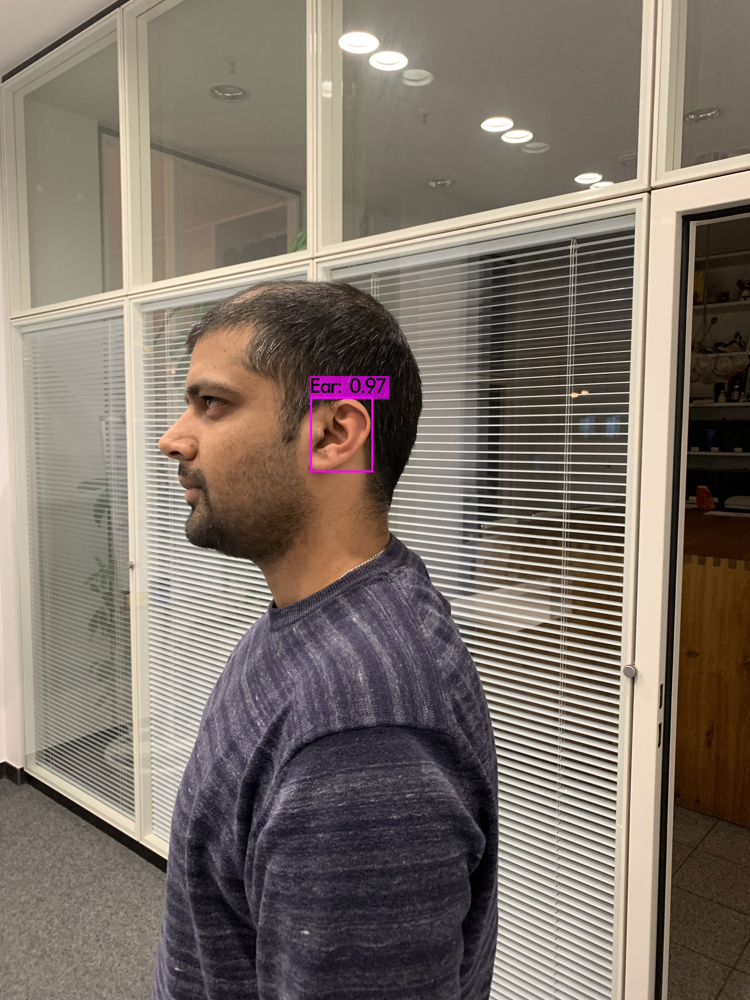

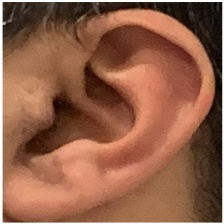

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
from re import search
import re

! ./darknet detector test /content/drive/MyDrive/obj.data /content/drive/MyDrive/yolov4.cfg /content/drive/MyDrive/Backup/yolov4_last.weights /content/drive/MyDrive/IMG_5240.png -thresh 0.4 -dont_show -ext_output > result.txt
img = cv2.imread('predictions.jpg', cv2.IMREAD_UNCHANGED)
cv2_imshow(img)




f = open("result.txt", "r")
for x in f:
  if search('left_x', x):
    #print(x)
    #left_x = int(search("(?<=left_x:\s).[0-9]+", x).group())
    #print(left_x)
    #top_y = int(search("(?<=top_y:\s).[0-9]+", x).group())
    #print(top_y)
    allCords =  re.findall(r'\d+', x)
    #print(allCords)
    getEar(allCords[1],allCords[2],allCords[3],allCords[4])

In [ ]:
#(left_x:  998   top_y:  324   width:   30   height:   52)
def getEar(x,y,width,height):
  x_min=int(x)-5
  x_max=x_min + int(width)+5
  y_min=int(y)-5
  y_max=y_min+ int(height)+5

  import cv2
  #img = cv2.imread('predictions.jpg', cv2.IMREAD_UNCHANGED)
  img = cv2.imread('/content/drive/MyDrive/IMG_5240.png', cv2.IMREAD_UNCHANGED)


  cv2.rectangle(img, (x_min, y_min), (x_max, y_max), (255, 255, 255), 3)
  crop_image = img[y_min:y_max, x_min:x_max]
  resize_image = cv2.resize(crop_image, (256, 256))

  cv2.imwrite('/content/drive/MyDrive/Backup/Object.jpg', resize_image);
  cv2.imwrite("Object.jpg",resize_image)

  img2 = cv2.imread('Object.jpg', cv2.IMREAD_UNCHANGED)
  cv2_imshow(img2)

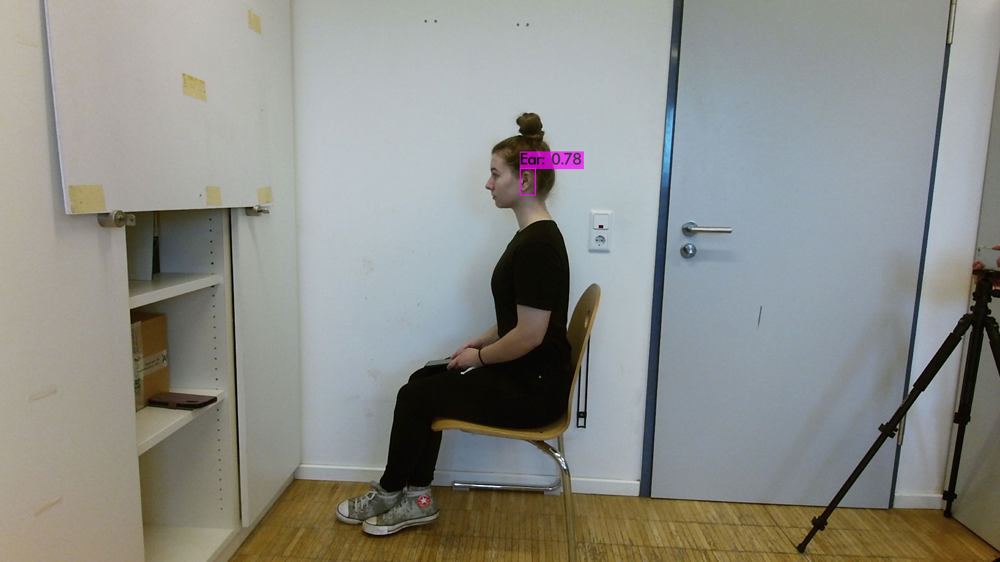

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

img = cv2.imread('predictions.jpg', cv2.IMREAD_UNCHANGED)
cv2_imshow(img)

**Checking mAP for trained data**


*   Data contained 1573 images with labeled txt files.






In [ ]:
!./darknet detector map /content/drive/MyDrive/obj.data /content/drive/MyDrive/yolov4.cfg /content/drive/MyDrive/Backup/yolov4_last.weights

 CUDA-version: 11010 (11020), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
valid: Using default 'data/train.txt'
 0 : compute_capability = 750, cudnn_half = 1, GPU: Tesla T4 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 Create CUDA-stream - 0 
 Create cudnn-handle 0 
conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     64       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  64 0.354 BF
   3 route  1 		                           ->  208 x 208 x  64 
   4 conv     64       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  64 0.354 BF
   5 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   6 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs

**Creating txt files for test images**

In [ ]:
import glob
x = '.png'
testlist = glob.glob("/content/drive/MyDrive/test/*/*{}".format(x),recursive=False)
print(len(testlist))
with open("/content/drive/MyDrive/test.txt",'w',encoding='utf-8') as f:
  for img in testlist:
    img=img.replace("\\","/")
    f.write(img+'\n')

482


In [ ]:
print(testlist)

['/content/drive/MyDrive/test/Drake_Bell/0001.png', '/content/drive/MyDrive/test/Drake_Bell/0000.png', '/content/drive/MyDrive/test/Drake_Bell/0002.png', '/content/drive/MyDrive/test/Drake_Bell/0004.png', '/content/drive/MyDrive/test/Drake_Bell/0007.png', '/content/drive/MyDrive/test/Drake_Bell/0003.png', '/content/drive/MyDrive/test/Drake_Bell/0005.png', '/content/drive/MyDrive/test/Drake_Bell/0006.png', '/content/drive/MyDrive/test/Donna_Murphy/0000.png', '/content/drive/MyDrive/test/Donna_Murphy/0001.png', '/content/drive/MyDrive/test/Donna_Murphy/0003.png', '/content/drive/MyDrive/test/Donna_Murphy/0002.png', '/content/drive/MyDrive/test/Donna_Murphy/0005.png', '/content/drive/MyDrive/test/Donna_Murphy/0004.png', '/content/drive/MyDrive/test/Donna_Murphy/0006.png', '/content/drive/MyDrive/test/David_Mamet/0005.png', '/content/drive/MyDrive/test/David_Mamet/0002.png', '/content/drive/MyDrive/test/David_Mamet/0000.png', '/content/drive/MyDrive/test/David_Mamet/0004.png', '/content/dr

**Checking the mAP for test data**

*   Test data includes 482 images(30 folders) with labeling and was not included in training.

precision = 0.95, recall = 0.99, F1-score = 0.97, TP = 477, FP = 25



In [ ]:
!./darknet detector map /content/drive/MyDrive/obj.data /content/drive/MyDrive/yolov4.cfg /content/drive/MyDrive/Backup/yolov4_last.weights -points 0

 CUDA-version: 11010 (11020), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 750, cudnn_half = 1, GPU: Tesla T4 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 Create CUDA-stream - 0 
 Create cudnn-handle 0 
conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     64       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  64 0.354 BF
   3 route  1 		                           ->  208 x 208 x  64 
   4 conv     64       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  64 0.354 BF
   5 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   6 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   8 conv  

In [ ]:
!./darknet detector test /content/drive/MyDrive/obj.data /content/drive/MyDrive/yolov4.cfg /content/drive/MyDrive/Backup/yolov4_last.weights -thresh 0.50 /content/drive/MyDrive/testing.png

 CUDA-version: 11020 (11020), cuDNN: 8.1.1, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 750, cudnn_half = 1, GPU: Tesla T4 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 Create CUDA-stream - 0 
 Create cudnn-handle 0 
conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     64       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  64 0.354 BF
   3 route  1 		                           ->  208 x 208 x  64 
   4 conv     64       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  64 0.354 BF
   5 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   6 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   8 conv  

In [ ]:
import os
from google.colab import drive
drive.mount('/content/drive')
#os.chdir('/content/drive/MyDrive/image_utility-master/image_utility-master')
#drive.mount('/content/drive/MyDrive/image_utility-master/image_utility-master')

Mounted at /content/drive


In [ ]:
!./darknet detector train /content/drive/MyDrive/Yolo/obj.data /content/drive/MyDrive/Yolo/yolov4.cfg  /content/drive/MyDrive/Yolo/Backup/yolov4.conv.137 -map

Streaming output truncated to the last 5000 lines.
v3 (iou loss, Normalizer: (iou: 0.07, obj: 1.00, cls: 1.00) Region 139 Avg (IOU: 0.880861), count: 5, class_loss = 0.254151, iou_loss = 18.423512, total_loss = 18.677662 
v3 (iou loss, Normalizer: (iou: 0.07, obj: 1.00, cls: 1.00) Region 150 Avg (IOU: 0.938886), count: 2, class_loss = 0.108342, iou_loss = 1.459267, total_loss = 1.567609 
v3 (iou loss, Normalizer: (iou: 0.07, obj: 1.00, cls: 1.00) Region 161 Avg (IOU: 0.000000), count: 1, class_loss = 0.000000, iou_loss = 0.000000, total_loss = 0.000000 
 total_bbox = 635299, rewritten_bbox = 0.000000 % 
v3 (iou loss, Normalizer: (iou: 0.07, obj: 1.00, cls: 1.00) Region 139 Avg (IOU: 0.879149), count: 9, class_loss = 0.002907, iou_loss = 24.677261, total_loss = 24.680168 
v3 (iou loss, Normalizer: (iou: 0.07, obj: 1.00, cls: 1.00) Region 150 Avg (IOU: 0.862817), count: 6, class_loss = 0.000119, iou_loss = 4.709971, total_loss = 4.710090 
v3 (iou loss, Normalizer: (iou: 0.07, obj: 1.00, 

In [ ]:
!./darknet detector train /content/drive/MyDrive/Yolo/obj.data /content/drive/MyDrive/Yolo/yolov4.cfg /content/drive/MyDrive/Yolo/Backup/yolov4_last.weights -map

 CUDA-version: 11080 (12000), cuDNN: 8.9.0, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 4.5.4
 Prepare additional network for mAP calculation...
 0 : compute_capability = 750, cudnn_half = 1, GPU: Tesla T4 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 Create CUDA-stream - 0 
 Create cudnn-handle 0 
conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     64       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  64 0.354 BF
   3 route  1 		                           ->  208 x 208 x  64 
   4 conv     64       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  64 0.354 BF
   5 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   6 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   7 Shortcut Layer: 4,  wt = 0, wn

In [ ]:
!./darknet detector valid /content/drive/MyDrive/Yolo/obj.data /content/drive/MyDrive/Yolo/yolov4.cfg /content/drive/MyDrive/Yolo/Backup/yolov4_last.weights

 CUDA-version: 11080 (12000), cuDNN: 8.9.0, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 4.5.4
results: Using default 'results'
 0 : compute_capability = 750, cudnn_half = 1, GPU: Tesla T4 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 Create CUDA-stream - 0 
 Create cudnn-handle 0 
conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     64       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  64 0.354 BF
   3 route  1 		                           ->  208 x 208 x  64 
   4 conv     64       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  64 0.354 BF
   5 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   6 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 208

In [ ]:


!zip -r /content/yolo.zip /content/darknet
# change sample_data.zip to your desired download name Ex: nothing.zip
# change sample_data to your desired download folder name Ex: ner_data

  adding: content/darknet/ (stored 0%)
  adding: content/darknet/backup/ (stored 0%)
  adding: content/darknet/.gitignore (deflated 43%)
  adding: content/darknet/.git/ (stored 0%)
  adding: content/darknet/.git/hooks/ (stored 0%)
  adding: content/darknet/.git/hooks/pre-commit.sample (deflated 45%)
  adding: content/darknet/.git/hooks/pre-push.sample (deflated 49%)
  adding: content/darknet/.git/hooks/pre-merge-commit.sample (deflated 39%)
  adding: content/darknet/.git/hooks/commit-msg.sample (deflated 44%)
  adding: content/darknet/.git/hooks/fsmonitor-watchman.sample (deflated 62%)
  adding: content/darknet/.git/hooks/post-update.sample (deflated 27%)
  adding: content/darknet/.git/hooks/applypatch-msg.sample (deflated 42%)
  adding: content/darknet/.git/hooks/pre-rebase.sample (deflated 59%)
  adding: content/darknet/.git/hooks/push-to-checkout.sample (deflated 55%)
  adding: content/darknet/.git/hooks/pre-receive.sample (deflated 40%)
  adding: content/darknet/.git/hooks/update.s